# Анализ рынка заведений общественного питания Москвы

**Цель исследования:** Помочь инвесторам с выбором категории и места для открытия заведения общественного питания в городе Москва.

**Задачи исследования**

- Проанализировать рынок общепита Москвы, найти особенности и закономерности.
- Выбрать подходящую категорию и место для открытия нового заведения.
- Проанализировать ценовые и другие критерии для нового заведения.

Источник данных - сервисы Яндекс Карты и Яндекс Бизнес.

Презентация: https://disk.yandex.ru/i/Gdg4tlBiHST6wQ

## Знакомство с данными

Подключим необходимые для работы библиотека.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

Считаем данные из файла.

In [2]:
try:
    df = pd.read_csv('datasets/moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.sample(n=5, random_state=1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1615,Cedro Albero,пиццерия,"Москва, 4-й Вятский переулок, 10",Северный административный округ,"ежедневно, 12:00–00:00",55.801487,37.576249,4.7,NaN,NaN,NaN,NaN,0,60.0
6204,Эдельвейс,кафе,"Москва, Ленинский проспект, 65, корп. 3",Юго-Западный административный округ,NaN,55.692059,37.557188,2.9,NaN,NaN,NaN,NaN,0,45.0
89,Сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120.0
307,Грузинский Дом у Наны,ресторан,"Москва, Фестивальная улица, 4А, стр. 1",Северный административный округ,пн-чт 11:30–23:00; пт-вс 11:30–00:00,55.855276,37.484727,4.6,NaN,NaN,NaN,NaN,0,100.0
1079,Le Chaton Gris,кофейня,"Москва, Сельскохозяйственная улица, 38, корп. 2",Северо-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.847098,37.631961,4.2,средние,Средний счёт:от 350 ₽,350.0,NaN,0,40.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Таблица содержит записи о 8406 заведениях. Каждое из заведений характеризуют до 13 полей:

- `name` — название заведения, строкойвый тип данных;
- `address` — адрес заведения, строкойвый тип данных;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня», строкойвый тип данных;
- `hours` — информация о днях и часах работы, строкойвый тип данных;
- `lat` — широта географической точки, в которой находится заведение, число с плавающей точкой;
- `lng` — долгота географической точки, в которой находится заведение, число с плавающей точкой;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0), число с плавающей точкой;
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее, строкойвый тип данных;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, строкойвый тип данных;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт», число с плавающей точкой;
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино», число с плавающей точкой; 
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки), целочисленный тип данных;
- `district` — административный район, в котором находится заведение, например Центральный административный округ, строкойвый тип данных;
- `seats` — количество посадочных мест, число с плавающей точкой.

Следующие поля имеют пропущенные значения:

`hours`, `price`, `avg_bill`, `seats`, `middle_avg_bill`, `middle_coffee_cup`.

В остальных полях данные полные.

## Предобработка данных

### Обработка дубликатов

Проверим данные на наличие дубликатов. Ориентироваться будем на пары "Название заведения" - "Адрес".

In [5]:
print('Количество явных дубликатов в данных:', df[df[['name','address']].duplicated()]['name'].count())

Количество явных дубликатов в данных: 0


Проверим также возможные дубликаты в названиямх несетевых заведений. Ведь одно заведение могли занести в базу два раза, ошибившись адресом.

In [6]:
df[(df['chain'] == 0) & (df[['name']].duplicated())]['name'].unique()

array(['Кафе', 'Шаурма', 'Ресторан', 'Столовая', 'Кафе-столовая', 'Буфет',
       'Кофейня', 'Бистро', 'Шашлычная', 'Пиццерия', 'Блины', 'Трапезная',
       'Поминальные обеды', 'Кафе для поминок', 'Чебуречная',
       'Кафе-кулинария'], dtype=object)

Среди повторяющихся названий несетевых заведений отсутствуют уникализированные. Даже если в данных есть дубликты с ошибочно указанными адресами, мы не сможем их выявить.

Посмотрим на уникальные значения некоторых полей, чтобы убедиться в отсутствии неявных дубликатов и других ошибок.

In [7]:
df['chain'].unique()

array([0, 1], dtype=int64)

In [8]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [9]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [10]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Неявных дубликатов не выявлено.

### Обработка пропусков

Проверим, какие поля имеют пропуски, посчитаем процент пропусков от общего числа записей для каждого поля.

In [11]:
null_data = pd.DataFrame(df.isna().sum()).reset_index()
null_data.columns = ['col_name','nulls']
null_data = null_data[null_data['nulls'] != 0].reset_index(drop=True)
null_data['nulls_percent'] = (null_data['nulls'] / df.shape[0] * 100).round(2)
null_data

,col_name,nulls,nulls_percent
0,hours,536,6.38
1,price,5091,60.56
2,avg_bill,4590,54.60
3,middle_avg_bill,5257,62.54
4,middle_coffee_cup,7871,93.64
5,seats,3611,42.96


Имеем пропуски в указанных выше полях. Заполним данные о часах работы значением-заглушкой.

In [12]:
df.loc[df['hours'].isna(), 'hours'] = 'неизвестно'

In [13]:
df[['avg_bill', 'middle_avg_bill', 'middle_coffee_cup']].notna().sum()

avg_bill             3816
middle_avg_bill      3149
middle_coffee_cup     535
dtype: int64

Видим, что суммарно количество записей о среднем чеке и средней чашке кофе не соответ суммарному количеству данных о средней стоимости заказа. Изучим эти пропуски подробнее.

In [14]:
df[(df['middle_coffee_cup'].notna()) & (df['middle_avg_bill'].notna())]['name'].count()

0

In [15]:
df[(df['avg_bill'].isna()) & (df['middle_coffee_cup'].notna()) & (df['middle_avg_bill'].notna())]['name'].count()

0

In [16]:
df[
    (df['avg_bill'].notna()) 
    & (df['middle_coffee_cup'].isna()) 
    & (df['middle_avg_bill'].isna())
]['avg_bill'].apply(lambda x: x.split(':')[0]).unique()

array(['Цена бокала пива'], dtype=object)

Видим, что данные в полях о средних чеках не пересекаются с данными о средней цене чашки кофе. Также видим, что данные о среднем чеке отсутствуют для рюмочных. Данный тип заведений нас не интересует, поэтому обрабатывать пропуски для него не будем.

Пропуски в других полях имеют слишком большую долю от числа записей в датасэте. Поэтому их заполнение на основе имеющихся данных затруднительно. Поблематично определить принцип обработки пропусков, который не повлиет на последующий анализ закономерностей. Оставим эти пропуски необработанными.

### Обработка аномалий

Посмотрим на данные по числу мест.

In [17]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Как видим, при медианном значении в 75, среди заведений есть такие, у которых число мест равно нулю или превышает 1000.

Построим график распределения.

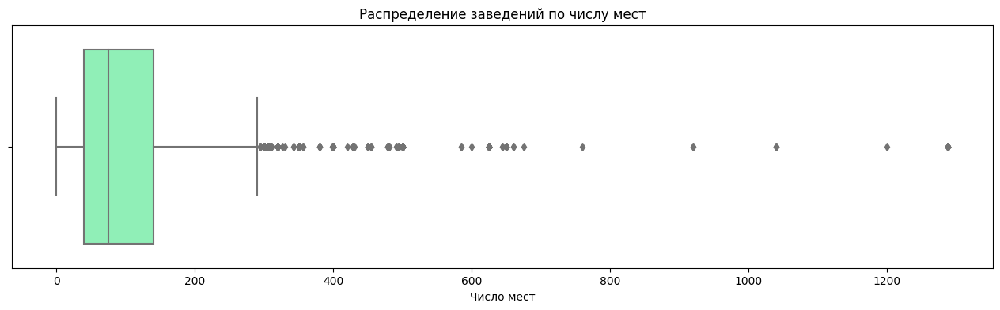

In [18]:
plt.figure(figsize=(16, 4))
sns.boxplot(data=df, x='seats', palette='rainbow')
plt.title('Распределение заведений по числу мест')
plt.xlabel('Число мест')
plt.show()

В левой части графика мы не видим сильных выбросов. Некоторые заведения могут работать только на вынос и не иметь посадочных мест.

А вот число мест более тысячи вызывает подозрение в нереалистичности данных, что подтверждают и выбросы на графике.

Данные неправдоподобны. Посчитаем выборочные перцентили.

In [19]:
df['seats'].quantile([.95, .99])

0.95    307.0
0.99    625.0
Name: seats, dtype: float64

Менее 1% заведений имеют более 625 мест. Эта цифра уже выглядит более правдоподобноей. Очистим данные от выбивающихся значений.

In [20]:
df = df[(df['seats'].isna()) | (df['seats'] <= 625)]

Столбец с меткой об отношении к сетям заменим на более читаемый

In [21]:
df['chain'] = df['chain'].apply(lambda x: 'сетевое' if x == 1 else 'несетевое')

### Добавление столбцов с данными

Добавим столбец `'street'` с названием улицы из столбца с адресом

In [22]:
df['street'] = df['address'].apply(lambda x: x.split(', ')[1])
df['street'] = df['street'].str.replace('улица ', '')
df['street'] = df['street'].str.replace(' улица', '')

Добавим столбец с обозначением, работает ли заведение круглосуточно.

In [23]:
df['is_24/7'] = False
df.loc[df['hours'] == 'ежедневно, круглосуточно', 'is_24/7'] = True

In [24]:
df.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3453,Чайхона Айва,кафе,"Москва, Садовая-Кудринская улица, 24/27",Центральный административный округ,"ежедневно, круглосуточно",55.762943,37.587995,4.3,средние,Средний счёт:от 250 ₽,250.0,NaN,сетевое,NaN,Садовая-Кудринская,True
6464,Свежая выпечка,быстрое питание,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.718115,37.784120,3.1,NaN,NaN,NaN,NaN,сетевое,116.0,Рязанский проспект,False
4046,Ресторан АрАрАт,ресторан,"Москва, улица Арбат, 32",Центральный административный округ,"ежедневно, 11:00–23:00",55.749057,37.589595,4.4,NaN,Средний счёт:900–1500 ₽,1200.0,NaN,несетевое,40.0,Арбат,False
6507,СушиСтор,ресторан,"Москва, улица Генерала Кузнецова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.685887,37.854593,3.7,NaN,NaN,NaN,NaN,сетевое,NaN,Генерала Кузнецова,False
4994,Paul,булочная,"Москва, Пятницкая улица, 20с1",Центральный административный округ,"пн-пт 07:30–22:00; сб,вс 09:00–22:00",55.741648,37.628334,4.7,NaN,NaN,NaN,NaN,сетевое,NaN,Пятницкая,False


Выполнили предобработку данных:
- убедились в отсутствии дубликатов,
- заполнили пропуски там, где это уместно и возможно,
- удалили объекты с аномально большими значениями часла посадочных мест,
- преобразовали значения в поле отношения к сетям,
- добавили столбцы с названием улицы и отметкой о круглосуточном графике работы.

## Анализ данных

### Распределение заведений по категориям

Изучим, какие категории заведений представлены в данных.

Исследуем количество объектов по категориям.

In [25]:
categories = pd.DataFrame(df['category'].value_counts()).reset_index()
categories.columns = ['category', 'quantity']
categories

,category,quantity
0,кафе,2370
1,ресторан,2036
2,кофейня,1408
3,"бар,паб",758
4,пиццерия,632
5,быстрое питание,602
6,столовая,314
7,булочная,256


Построим диаграмму распределения категорий по количеству заведений.

In [26]:
# строим столбчатую диаграмму 
fig = px.bar(categories.sort_values(by='quantity', ascending=True), # загружаем данные и заново их сортируем
             x='quantity', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='quantity' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве заведений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='категория заведения')
fig.show() # выводим график

Для понимания соотношения между категориями построим круговую диаграмму.

In [27]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=categories['category'], # указываем значения, которые появятся на метках сегментов
                             values=categories['quantity'])]) # указываем данные, которые отобразятся на графике
fig.update_layout(title='Доля заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.update_traces(textposition='inside',textinfo='percent+value')
fig.show() # выводим график

Всего имеем данные о заведениях в восьми категориях. Наибольшее количество заведений - в категориях `кафе` и `ресторан`. Суммарно в этих категориях представленно более половины всех заведений. На третьем месте - кофейни, занимающие 16,8% рынка. Наименьшее количество заведений - в категориях `булочная` и `столовая`.

### Распределение заведений по числу посадочных мест

Исследуем количество посадочных мест в заведениях по категориям.

Посчитаем медианные значения числа посадочных мест по категориям

In [28]:
# готовим данные, 
seats_median = df.groupby('category').agg({'seats': 'median'}).sort_values('seats', ascending=False).reset_index()
seats_median

,category,seats
0,ресторан,86.0
1,"бар,паб",80.0
2,кофейня,80.0
3,столовая,75.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,53.5
7,булочная,50.0


Построим диаграммы распределений числа мест по категориям заведений.

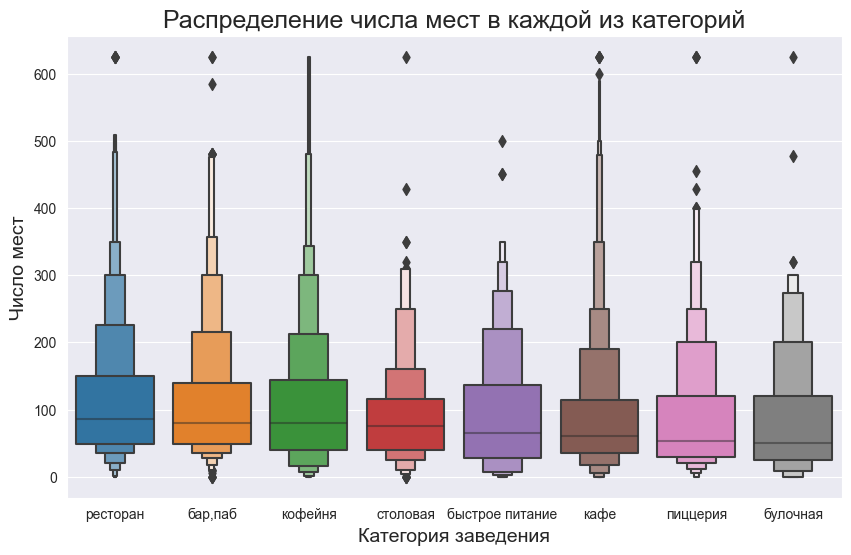

In [29]:
plt.figure(figsize=(10, 6))
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
# строим график boxenplot средствами seaborn
sns.boxenplot(x='category', y='seats', data=df, order=seats_median['category'])
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение числа мест в каждой из категорий', fontsize=(18))
plt.xlabel('Категория заведения', fontsize=(14))
plt.ylabel('Число мест', fontsize=(14))
# отображаем график на экране
plt.show()

Как видим из графиков, для всех категорий число посадочных мест распредлено в очень широком диапазоне. Основная масса заведений имеет число мест от 25 до 150.  Средние значения, в зависимости от категории, колеблются между 50 и 86. Наибольшее срденее число мест имеют рестораны (86), на втором месте - бары и кофейни (по 80), наименьшее - булочные (50) и пиццерии (54). Наиболее крупные заведения чаще встречаются среди кафе и кофеен. За ними идут рестораны и бары.

Такая статистика может быть обусловлена тем, что в кофейнях и барах, как правило, на одно посадочное место отводится меньшая площадь помещения, что позволяет разместить больше посетителй. Булочные и пиццерии не предполагают, что посетители будут находиться в зале долго, поэтому имеют наименьшее количество посадочных мест, в отличии от ресторанов, для которых свойственно продолжительное нахождение клиентов за время одного визита. При этом категория кафе - наиболее распространенная. Поэтому представляется заведениями с количеством мест в наиболее широком диапазоне.

### Сетевые заведения

Рассмотрите соотношение сетевых и несетевых заведений.

In [30]:
df_chain = df.groupby('chain', as_index=False).agg(places=('name', 'count'))
display(df_chain)

# строим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=df_chain['chain'], # значения для меток сегментов
                             values=df_chain['places'],  # данные для отображения на графике
                             pull = [0.03, 0.03])]) # выделяем сегмент-лидер на графике

fig.update_layout(title='Соотношение сетевых и несетевых заведений', # заголовок графика
                  width=600, # размеры графика
                  height=450,
                  annotations=[dict(x=1.32, # аннотация легенды
                                    y=1.06,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() # выводим график

,chain,places
0,несетевое,5182
1,сетевое,3194


Несетевых заведений больше, чем сетевых.

Изучим соотношение сетевых и несетевых заведений по категориям.

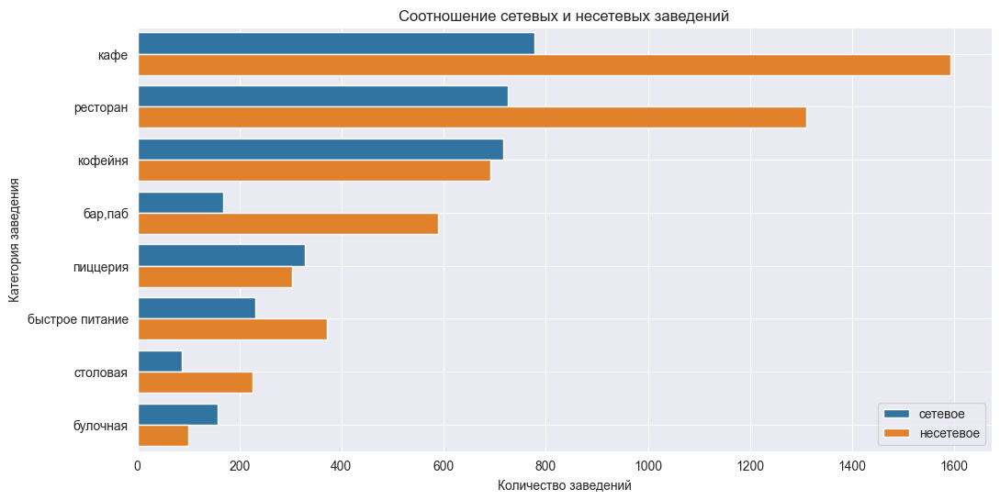

In [31]:
# группируем данные по категориям и отношению к сетям и считаем количество заведений
df_chain = df.groupby(['category', 'chain'], as_index = False)[['name']].count().sort_values('name')
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(12, 6))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=df_chain, hue='chain', order=categories['category'])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Не смотря на то, что несетевых заведений в целом оказалось в полтора раза больше, чем сетевых, в некотрых категориях сети преобладают. Это касается категорий "кофейня", "пиццерия", и "булочная". Открытие сети в этих категориях позволяет повысить узнаваемость бренда и выдержать конкуренцию. К тому же в этих категориях заведения часто открываются по франшизе.

Наибольший разрыв между числом несетевых заведений по отношению к сетевым показывают категории баров и столовых. В этих категориях конкуренция ниже за счет отсутствия большого числа известных сетей.

### Самые распространенные заведения

Найдем ТОП-15 популярных сетей в Москве.

In [32]:
top_chains = (
    df[df['chain'] == 'сетевое']
    .groupby('name', as_index=False)
    .agg(quantity=('name', 'count'))
    .sort_values('quantity', ascending=False)
    .head(15)
             )

# строим столбчатую диаграмму 
fig = px.bar(top_chains.sort_values('quantity'), x='quantity', y='name', text='quantity')
# оформляем график
fig.update_layout(title='Самые распространенные заведения',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show() # выводим график

Наибольшим числом заведений представлена сеть "Шоколадница". На втором и третьем местах - "Домино'с Пицца" и "Додо Пицца".

Также в рейтинг попали организации с неуникальными названиями, такими как "Хинкальная" и "Чайхана", что говорит об отсутствии креативности у их владельцев.

Определим категории самых популярных заведений.

In [33]:
cat_top = (
    df[df['name'].isin(top_chains['name'])]
    .groupby('category', as_index=False)
    .agg(cat_count=('category', 'count'))
    .sort_values('cat_count', ascending=False)
)
cat_top

# строим столбчатую диаграмму 
fig = px.bar(cat_top.sort_values('cat_count'), x='cat_count', y='category', text='cat_count')
# оформляем график
fig.update_layout(title='Распределение заведений крупнейших сетей по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения')
fig.show() # выводим график

Популярные заведения представлены во всех категориях. Наиболее распространенные из них - кофейни. Наименее - столовые и бары.

### Рейтинги заведений

Изучим распределение средних рейтингов по категориям заведений.

In [34]:
median_rates = (
    df.groupby('category', as_index=False)
    .agg(rate=('rating', 'median'))
    .sort_values('rate')
    .reset_index(drop=True)
               )

In [35]:
# строим столбчатую диаграмму 
fig = px.bar(median_rates.sort_values('rate'), x='rate', y='category', text='rate')
# оформляем график
fig.update_layout(title='Средние рейтинги заведений по категориям',
                  xaxis_title='Средний рейтинг',
                  yaxis_title='Категория заведения',
                  xaxis_range=[4, 4.5])
fig.show() # выводим график

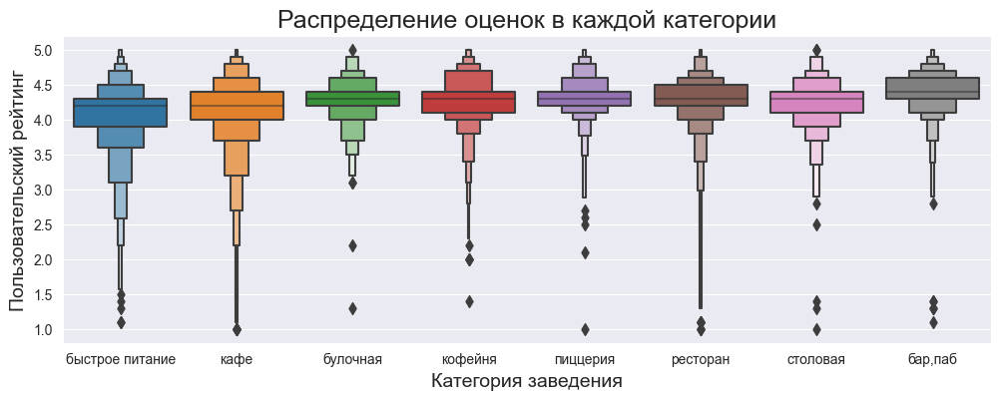

In [36]:
plt.figure(figsize=(12, 4))
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
# строим график boxenplot средствами seaborn
sns.boxenplot(x='category', y='rating', data=df, order=median_rates['category'])
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение оценок в каждой категории', fontsize=(18))
plt.xlabel('Категория заведения', fontsize=(14))
plt.ylabel('Пользовательский рейтинг', fontsize=(14))
# отображаем график на экране
plt.show()

Оценим средние рейтинги крупных сетевых заведений.

In [37]:
(
    df[df['name'].isin(top_chains['name'])]
    .groupby('name', as_index=False)
    .agg(rate=('rating', 'median'))
    .sort_values('rate', ascending=False)
    .reset_index(drop=True)
)

,name,rate
0,Буханка,4.40
1,Кулинарная лавка братьев Караваевых,4.40
2,Хинкальная,4.40
3,Додо Пицца,4.30
4,Му-Му,4.30
5,One Price Coffee,4.20
6,Prime,4.20
7,Домино'с Пицца,4.20
8,КОФЕПОРТ,4.20
9,Шоколадница,4.20


Усредненные рейтинги отличаются не сильно между категориями заведений и располагаются в диапазоне 4.2...4.4. Однако, заведения быстрого питания, кафе и рестораны чаще получают низкие оценки, чем заведения других категория. Реже всех получают низкие оценки булочные.

Наивысшие средние рейтинги среди крупных сетей, равные 4.4, имеют точки "Буханки", "Кулинарной лавки Караваевых" и "Хинкальной". Худший средний рейтинг среди крупных сетевых заведений, равный 4.0, имеют точки "Яндекс Лавуи".

### География заведений

Изучим географию рпспределения заведений.

#### Распределение заведений по районам

Изучим распределение объектов по районам и категориям.

In [38]:
df_districts = (
    df.groupby(['district', 'category'], as_index=False)
    .agg(cnt=('name', 'count'))
    .sort_values('cnt', ascending=False)
    .reset_index(drop=True)
               )

In [39]:
fig = px.bar(df_districts, x='cnt', y='district', color='category')
fig.update_layout(title='Распределение заведений по районам и категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Районы города')
fig.show()

Наибольшее количество заведений располагается в ЦАО, наименьшее - в СЗАО. В ЦАО наиболее распространенная категория заведений - рестораны. В остальных районах преобладают кафе. Количество заведений в ЦАО превышает количество заведений в каждом другом районе минимум в два раза.

Отобразим все заведения на карте.

In [40]:
# создаём карту Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Рейтинги заведений по районам

Построим фоновую картограмму и оценим средние рейтинги заведений по районам.

In [41]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')

In [42]:
# загружаем JSON-файл с границами округов Москвы
try:
    with open('datasets/admin_level_geomap.geojson', 'r') as f:
        state_geo = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        state_geo = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Сильного отиличия в усредненном рейтинге между районами не наблюдаются. Усредненные рейтинги находятся в диапазоне от 4.2 до 4.4. Наивысший усредненный рейтинг имеют заведения ЦАО, наименьший - СВАО и ЮВАО.

#### Улицы с наибольшим и наименьшим количеством объектов

Найдем ТОП-15 улиц по количеству заведений. Построим график распредления количества заведений и их категорий по этим улицам.

In [43]:
top_streets = (
    df.groupby('street', as_index=False)
    .agg(places_cnt=('name', 'count'))
    .sort_values('places_cnt', ascending=False)
    .head(15)
    .reset_index(drop=True)
)

In [44]:
top_streets

,street,places_cnt
0,проспект Мира,184
1,Профсоюзная,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [45]:
df_streets_cat = (
    df[df['street'].isin(top_streets['street'])]
    .groupby(['street', 'category'], as_index=False)
    .agg(cnt=('name', 'count'))
    .sort_values('cnt', ascending=False)
    .reset_index(drop=True)
               )

In [46]:
fig = px.bar(df_streets_cat, x='cnt', y='street', color='category')
fig.update_layout(title='Распределение заведений по улицам и категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица')
fig.show()

Наибольшее количество заведений располагается на проспекте Мира. С большим отставанием идут Профсоюзная улица и Ленинградский проспект. Кафе и рестораны преобладают над другими категориями заведений на улицах с наибольшим количеством предприятий общественного питания.

Найдем улицы с нименьшим количеством объектов общепита.

In [47]:
places_by_streets = (
    df.groupby('street', as_index=False)
    .agg(places_cnt=('name', 'count'))
    .sort_values('places_cnt')
    .reset_index(drop=True)
)

antytop_streets = places_by_streets[places_by_streets['places_cnt'] == 1]

In [48]:
places_antytop = df[df['street'].isin(antytop_streets['street'])]

In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
places_antytop.apply(create_clusters, axis=1)

# выводим карту
m

Улицы, на которых располагается только один объект общепита либо очень короткие, либо значительно удалены от центра, либо находятся в промзонах.

#### Ценовой индикатор районов

Посчитаем ценовой индикатор районов на основе усредненных значений средних чеков заведений.

In [50]:
avg_bill_by_district = df.groupby('district', as_index=False).agg(price_indicator=('middle_avg_bill', 'median'))

In [51]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_by_district,
    columns=['district', 'price_indicator'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [52]:
avg_bill_by_district.sort_values('price_indicator', ascending=False)

,district,price_indicator
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


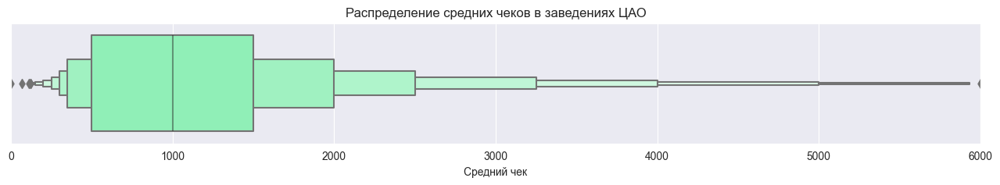

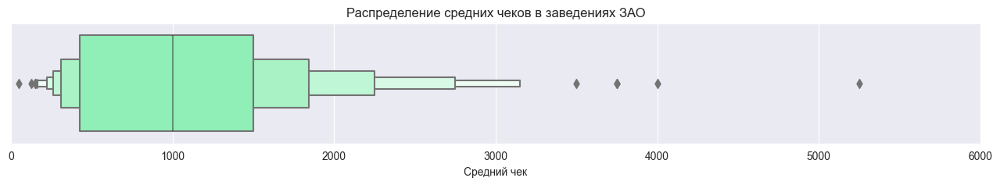

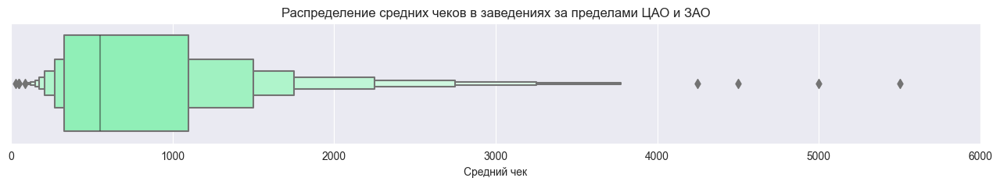

In [53]:
plt.figure(figsize=(16, 2))
sns.boxenplot(data=df[df['district'] == 'Центральный административный округ'], 
              x='middle_avg_bill', palette='rainbow')
plt.title('Распределение средних чеков в заведениях ЦАО')
plt.xlabel('Средний чек')
plt.xlim(0, 6000)
plt.show()

plt.figure(figsize=(16, 2))
sns.boxenplot(data=df[df['district'] == 'Западный административный округ'], 
              x='middle_avg_bill', palette='rainbow')
plt.title('Распределение средних чеков в заведениях ЗАО')
plt.xlabel('Средний чек')
plt.xlim(0, 6000)
plt.show()

plt.figure(figsize=(16, 2))
sns.boxenplot(data=df[~df['district'].isin(['Центральный административный округ', 
                                            'Западный административный округ'])], 
              x='middle_avg_bill', palette='rainbow')
plt.title('Распределение средних чеков в заведениях за пределами ЦАО и ЗАО')
plt.xlabel('Средний чек')
plt.xlim(0, 6000)
plt.show()

Самые дорогие округа по среднему чеку заведений - ЦАО и ЗАО. Удаленность от центра влияет на цены в заведениях. Чем ближе к центру, тем больше объектов с более высокой ценой.

### Выводы по анализу объектов

- Заведения в таблице поделены на восемь категорий. Наибольшее количество заведений - в категориях кафе и ресторанов. Суммарно в этих категориях представлено более половины всех предприятий общественного питания. На третьем месте - кофейни, занимающие 16,8% рынка. Наименьшее количество заведений - в категориях булочная и столовая.


- Число посадочных мест для предприятий всех категорий распределено в очень широком диапазоне. Основная масса заведений имеет от 25 до 150 посадочных мест. Средние значения, в зависимости от категории, колеблются между 50 и 86. Наибольшее среднее число мест имеют рестораны (86), на втором месте - бары и кофейни (по 80), наименьшее - булочные (50) и пиццерии (54). Наиболее крупные заведения по числу мест чаще встречаются среди кафе и кофеен. За ними идут рестораны и бары. Такая статистика может быть обусловлена тем, что в кофейнях и барах, как правило, на одно посадочное место отводится меньшая площадь помещения, что позволяет разместить больше посетителей. Булочные и пиццерии не предполагают, что посетители будут находиться в зале долго, поэтому имеют наименьшее количество посадочных мест, в отличии от ресторанов, для которых свойственно продолжительное нахождение клиентов за время одного визита. При этом категория кафе - наиболее многочисленная, поэтому количество мест в них представлено наиболее широким диапазоном.


- Несмотря на то, что несетевых заведений в целом оказалось в полтора раза больше, чем сетевых, в некоторых категориях сети преобладают. Это касается категорий "кофейня", "пиццерия", и "булочная". Открытие сети в этих категориях позволяет повысить узнаваемость бренда и выдержать конкуренцию. К тому же в этих категориях заведения часто открываются по франшизе. Наибольший разрыв между числом несетевых заведений по отношению к сетевым показывают категории баров и столовых. В этих категориях конкуренция ниже за счет отсутствия большого числа крупных и известных сетей.


- Наибольшим числом заведений представлена сеть "Шоколадница" со 118 точками. На втором и третьем местах - "Домино'с Пицца" (76 объектов) и "Додо Пицца" (74 объекта). Популярные сетевые заведения представлены во всех категориях. Наиболее распространенные из них – кофейни (333 точки). 


- Усредненные по районам и по категориям заведений пользовательские рейтинги различаются не сильно, располагаясь в диапазоне 4.2...4.4. Однако, заведения быстрого питания, кафе и рестораны чаще получают низкие оценки, чем предприятия других категорий. Реже всех получают низкие оценки булочные. Наивысший усредненный рейтинг имеют заведения ЦАО, наименьший - СВАО и ЮВАО.


- Наибольшее количество заведений располагается в ЦАО, наименьшее - в СЗАО. Количество заведений в ЦАО превышает количество заведений в каждом другом районе минимум в два раза. наиболее распространенная категория заведений в ЦАО - рестораны. В остальных районах преобладают кафе.


- Наибольшее количество заведений располагается на проспекте Мира. С большим отставанием идут Профсоюзная улица и Ленинградский проспект. Кафе и рестораны преобладают над другими категориями заведений на улицах с наибольшим количеством предприятий общественного питания.


- Самые дорогие округа по среднему чеку заведений - ЦАО и ЗАО. Удаленность от центра влияет на цены в заведениях. Чем ближе к центру, тем больше объектов с более высокой ценой.

### Детализация анализа кофеен

In [54]:
coffee_houses = df[df['category'] == 'кофейня']

In [55]:
print('Всего кофеен в датасете:', coffee_houses.shape[0])

Всего кофеен в датасете: 1408


In [56]:
coffee_houses_by_districts = (
    coffee_houses
    .groupby('district', as_index=False)
    .agg({'name': 'count', 'rating': 'median', 'middle_coffee_cup': 'median', 'is_24/7': 'sum'})
    .sort_values('name', ascending=False)
)
coffee_houses_by_districts.rename(columns={'name': 'quantity'}, inplace=True)
coffee_houses_by_districts['%%24/7'] = (
    (coffee_houses_by_districts['is_24/7'] / coffee_houses_by_districts['quantity'] * 100).round(2)
)
coffee_houses_by_districts

,district,quantity,rating,middle_coffee_cup,is_24/7,%%24/7
5,Центральный административный округ,428,4.3,190.0,26,6.07
2,Северный административный округ,193,4.3,159.0,5,2.59
3,Северо-Восточный административный округ,159,4.3,162.5,3,1.89
1,Западный административный округ,146,4.2,187.0,9,6.16
8,Южный административный округ,131,4.3,150.0,1,0.76
0,Восточный административный округ,104,4.3,135.0,5,4.81
7,Юго-Западный административный округ,96,4.3,198.0,7,7.29
6,Юго-Восточный административный округ,89,4.3,147.5,1,1.12
4,Северо-Западный административный округ,62,4.3,165.0,2,3.23


In [57]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_houses_by_districts.sort_values('quantity'), 
             x='quantity', y='district', text='quantity')
# оформляем график
fig.update_layout(title='Количество кофеен по районам',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Округ')
fig.show() # выводим график

In [58]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_houses.apply(create_clusters, axis=1)

Choropleth(
    geo_data=state_geo,
    fill_color='YlGn',
    fill_opacity=0.3,
).add_to(m)

# выводим карту
m

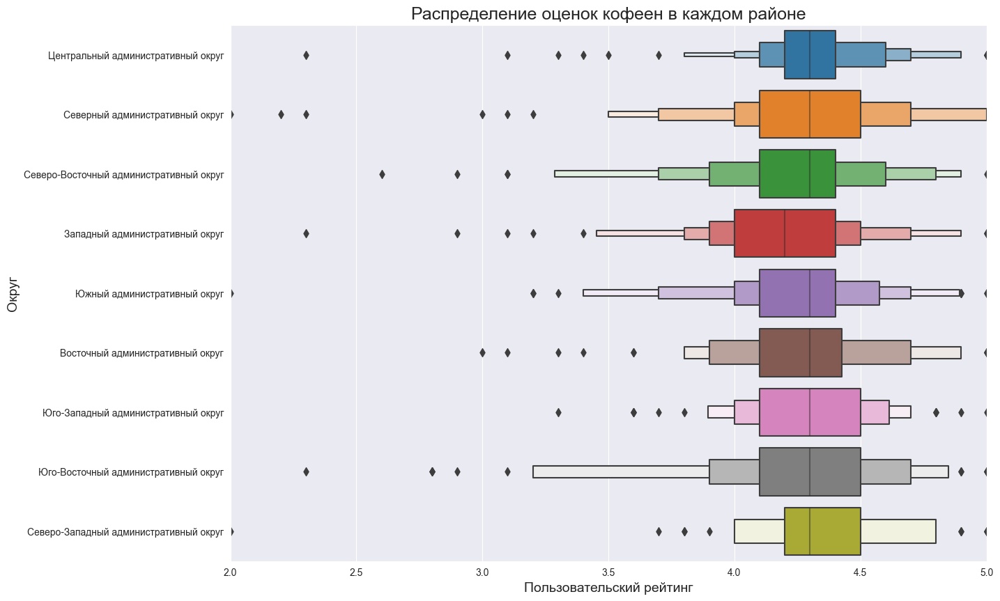

In [59]:
plt.figure(figsize=(14, 10))
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
# строим график boxenplot средствами seaborn
sns.boxenplot(y='district', x='rating', data=coffee_houses, order=coffee_houses_by_districts['district'])
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение оценок кофеен в каждом районе', fontsize=(18))
plt.xlabel('Пользовательский рейтинг', fontsize=(14))
plt.ylabel('Округ', fontsize=(14))
plt.xlim(2, 5)
# отображаем график на экране
plt.show()

In [60]:
# строим столбчатую диаграмму 
fig = px.bar(coffee_houses_by_districts.sort_values('middle_coffee_cup'), 
             x='middle_coffee_cup', y='district', text='middle_coffee_cup')
# оформляем график
fig.update_layout(title='Усредненная цена чашки кофе по районам',
                   xaxis_title='Усредненная цена чашки кофе',
                   yaxis_title='Округ',
                   xaxis_range=[100, 200])
fig.show() # выводим график

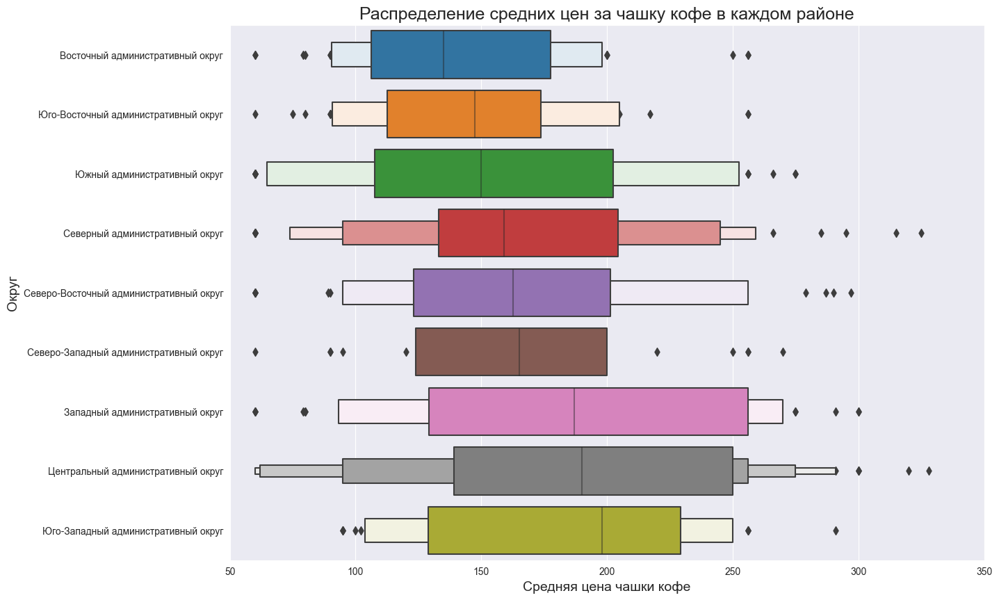

In [61]:
plt.figure(figsize=(14, 10))
# применяем стиль darkgrid из библиотеки seaborn
sns.set_style('darkgrid')
# строим график boxenplot средствами seaborn
sns.boxenplot(
    y='district', 
    x='middle_coffee_cup', 
    data=coffee_houses, 
    order=coffee_houses_by_districts.sort_values('middle_coffee_cup')['district']
)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних цен за чашку кофе в каждом районе', fontsize=(18))
plt.xlabel('Средняя цена чашки кофе', fontsize=(14))
plt.ylabel('Округ', fontsize=(14))
plt.xlim(50, 350)
# отображаем график на экране
plt.show()

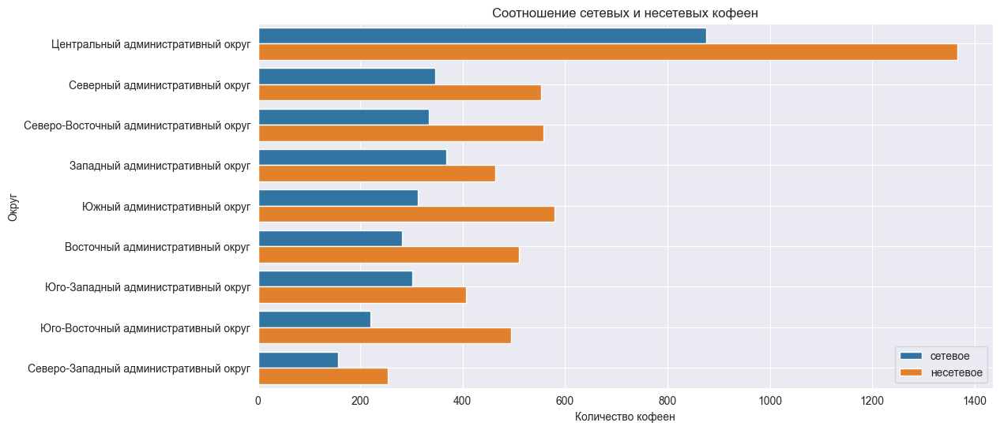

In [62]:
# группируем данные по категориям и отношению к сетям и считаем количество заведений
coffee_houses_chain = df.groupby(['district', 'chain'], as_index = False)[['name']].count().sort_values('name')
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(12, 6))
# строим столбчатый график средствами seaborn
sns.barplot(
    x='name',
    y='district', 
    data=coffee_houses_chain, 
    hue='chain', 
    order=coffee_houses_by_districts['district']
)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Соотношение сетевых и несетевых кофеен')
plt.xlabel('Количество кофеен')
plt.ylabel('Округ')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Больше всего кофеен - в ЦАО. Здесь они часто располагаются в достаточном удалении друг от друга в жилых домах и административных зданиях. За пределами ЦАО многие кофейни размещаются в зданиях торгово-развлекательных центров.

В каждом из районов лишь небольшая доля кофеен работают круглосуточно (от 0,7% до 7,3%).

Средний рейтинг кофеен по всем районам составляет 4.3. Исключений - ЗАО с  рейтингом 4.2. Чаще остальных плохие оценки получают заведения ЮВАО и СВАО.

Средняя стоимость чашки кофе значительно различатеся между районами. Наиболее высокие средние цены - в ЮЗАО (198 рублей за чашку). Наиболее низкие цены - в ВАО (135 рублей). Определять стоимость чашки капучино следует после выбора места открытия заведения и анализа цен в ближайших точках, так как средние цены на чашку кофе во всех районах варьируются в очень широких диапазонах: от 60 до 200 рублей за чашку.

### Выводы и рекомендации

Лучший район для открытия кофейни - СЗАО.

В этом округе располагается наименьшее количество предприятий общественного питания в целом, и кофеен в частности. Здесь же - наименьшее количество сетевых заведений. Благодяря этому удастся избежать высокой конкуренции с другими предприятими общепита, в том числе с известными сетями.

Также в этом округе самая благосклонная аудитория (мозможно, именно из-за нехватки мест) - подавляющее большинство кофеен имеют пользовательские рейтинги от 4.0 и выше, что значительно лучше показателя других окургов, где гораздо чаще ставят оценку ниже 4.0.

Кроме того здесь довольно высокая средняя цена чашки кофе в сравнении с другими районами (165 рублей). Выше этот показатель только в ЦАО, ЗАО и ЮЗАО. Это говороит о высокой платежеспособности жителей округа.

Также хорошим решением будет открытие не одной точки, а сети кофеен. Это позволит конкурировать с известными сетевыми заведениями, так как, несмотря на малое количество сетевых объктов, их доля довольно высока.